## 1. Import Toolkit

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

## 2. Data Load

### Note that you need to complete the previous jupyter notebook file '1-Data Exploration.ipynb' before executing this step

### We can get the processed data from the saved CSV

In [2]:
all_data = pd.read_csv('./processed_zhengqi_data.csv')
display(all_data.head())
cond = all_data['label'] == 'train'
train_data = all_data[cond]
train_data.drop(labels='label', axis=1, inplace=True)
train_data.head()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V27,V28,V29,V30,V31,V35,V36,V37,target,label
0,0.566,0.016,-0.143,0.407,0.452,-1.812,-2.360,-0.436,-0.940,-0.073,...,0.168,-0.450,0.136,0.109,-0.615,-5.101,-2.608,-3.508,0.175,train
1,0.968,0.437,0.066,0.566,0.194,-1.566,-2.360,0.332,0.188,-0.134,...,0.338,0.671,-0.128,0.124,0.032,0.364,-0.335,-0.730,0.676,train
2,1.013,0.568,0.235,0.370,0.112,-1.367,-2.360,0.396,0.874,-0.072,...,0.326,1.287,-0.009,0.361,0.277,0.364,0.765,-0.589,0.633,train
3,0.733,0.368,0.283,0.165,0.599,-1.200,-2.086,0.403,0.011,-0.014,...,0.277,1.298,0.015,0.417,0.279,0.364,0.333,-0.112,0.206,train
4,0.684,0.638,0.260,0.209,0.337,-1.073,-2.086,0.314,-0.251,0.199,...,0.332,1.289,0.183,1.078,0.328,0.364,-0.280,-0.028,0.384,train


,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V24,V27,V28,V29,V30,V31,V35,V36,V37,target
0,0.566,0.016,-0.143,0.407,0.452,-1.812,-2.360,-0.436,-0.940,-0.073,...,0.800,0.168,-0.450,0.136,0.109,-0.615,-5.101,-2.608,-3.508,0.175
1,0.968,0.437,0.066,0.566,0.194,-1.566,-2.360,0.332,0.188,-0.134,...,0.801,0.338,0.671,-0.128,0.124,0.032,0.364,-0.335,-0.730,0.676
2,1.013,0.568,0.235,0.370,0.112,-1.367,-2.360,0.396,0.874,-0.072,...,0.961,0.326,1.287,-0.009,0.361,0.277,0.364,0.765,-0.589,0.633
3,0.733,0.368,0.283,0.165,0.599,-1.200,-2.086,0.403,0.011,-0.014,...,1.435,0.277,1.298,0.015,0.417,0.279,0.364,0.333,-0.112,0.206
4,0.684,0.638,0.260,0.209,0.337,-1.073,-2.086,0.314,-0.251,0.199,...,0.881,0.332,1.289,0.183,1.078,0.328,0.364,-0.280,-0.028,0.384


## 3. Maximum and Minimum Normalization

In [3]:
# Feature Normalization
columns = list(all_data.columns)
# Remove column label index
columns.remove('label')
# Delete target value
columns.remove('target')
all_data[columns].describe()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V23,V24,V27,V28,V29,V30,V31,V35,V36,V37
count,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,...,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000
mean,0.000080,0.000082,-0.000043,-0.000013,0.000085,0.000118,0.000116,0.000049,-0.000089,0.000071,...,0.000022,-0.000264,0.000046,-0.000107,0.000014,0.000006,-0.000004,-0.000079,-0.000110,0.000083
std,1.000013,1.000016,1.000007,0.999995,1.000015,1.000035,1.000030,0.999994,1.000017,1.000014,...,1.000003,1.000184,0.999999,1.000031,0.999997,0.999993,0.999999,1.000062,1.000019,1.000017
min,-4.814000,-5.488000,-4.283000,-3.956000,-4.921000,-5.649000,-5.625000,-6.059000,-2.584000,-5.505000,...,-5.552000,-1.344000,-6.874000,-2.435000,-2.912000,-4.507000,-7.698000,-7.477000,-2.608000,-3.630000
25%,-0.468000,-0.319000,-0.625000,-0.651000,-0.428000,-0.494000,-0.368000,-0.429000,-0.476000,-0.434000,...,-0.187000,-1.191000,0.056000,-0.454000,-0.721000,-0.301000,-0.300000,-0.349000,-0.485000,-0.666000
50%,0.245000,0.237000,0.105000,0.073000,0.114000,0.191000,0.198000,0.231000,0.133000,0.125000,...,0.331000,0.094000,0.270000,-0.446000,-0.097000,0.038000,0.217000,0.364000,0.115000,-0.043000
75%,0.666000,0.595000,0.698000,0.704000,0.576000,0.705000,0.684000,0.637000,0.626000,0.604000,...,0.360000,0.821000,0.399000,0.500000,0.623000,0.469000,0.578000,0.364000,0.647000,0.647000
max,2.121000,2.120000,2.828000,2.603000,4.475000,1.895000,1.918000,2.408000,4.830000,4.011000,...,1.906000,2.423000,0.925000,4.671000,4.580000,3.139000,2.013000,2.324000,5.238000,3.021000


### Use sklearn method of normalization

In [4]:
# Import package
from sklearn import preprocessing
min_max_scaler = preprocessing.MinMaxScaler()

# After processing, convert the data into a Numpy array
all_data_normed = min_max_scaler.fit_transform(all_data[columns])
all_data_normed = pd.DataFrame(all_data_normed, columns=columns)
all_data_normed.describe()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V23,V24,V27,V28,V29,V30,V31,V35,V36,V37
count,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,...,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000,4813.000000
mean,0.694172,0.721357,0.602300,0.603139,0.523743,0.748823,0.745740,0.715607,0.348518,0.578507,...,0.744438,0.356712,0.881401,0.342653,0.388683,0.589459,0.792709,0.762873,0.332385,0.545795
std,0.144198,0.131443,0.140628,0.152462,0.106430,0.132560,0.132577,0.118105,0.134882,0.105088,...,0.134085,0.265512,0.128221,0.140731,0.133475,0.130786,0.102976,0.102037,0.127456,0.150356
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.626676,0.679416,0.514414,0.503888,0.478182,0.683324,0.696938,0.664934,0.284327,0.532892,...,0.719362,0.040616,0.888575,0.278778,0.292445,0.550092,0.761816,0.727273,0.270584,0.445647
50%,0.729488,0.752497,0.617072,0.614270,0.535866,0.774125,0.771974,0.742884,0.366469,0.591635,...,0.788817,0.381736,0.916015,0.279904,0.375734,0.594428,0.815055,0.800020,0.347056,0.539317
75%,0.790195,0.799553,0.700464,0.710474,0.585036,0.842259,0.836405,0.790835,0.432965,0.641971,...,0.792706,0.574728,0.932555,0.413031,0.471837,0.650798,0.852229,0.800020,0.414861,0.643061
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## 4. Data Normalization Operation (Box-Cox Transformation)

### First, we use the $V0$ feature to conduct experiments, check the data distribution histogram, and draw a Quantile-Quantile Plots to see if it is close to a normal distribution.

### Get train data

In [5]:
cond = all_data['label'] == 'train'
train_data = all_data[cond]
train_data.drop(labels='label', axis=1, inplace=True)

Text(0.5, 1.0, 'corr=0.87')

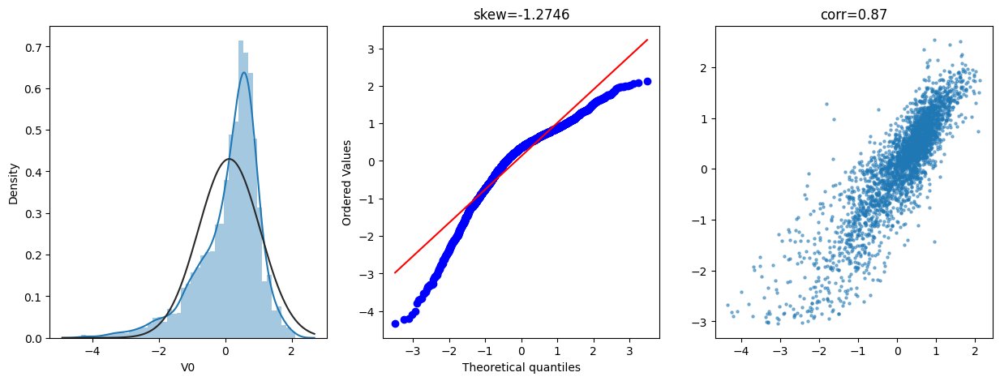

In [6]:
plt.figure(figsize = (15,5))
ax = plt.subplot(1,3,1)   # Draw historgram
sns.distplot(train_data['V0'], fit=stats.norm)

ax = plt.subplot(1,3,2)  # Draw Quantile-Quantile Plots
stats.probplot(train_data['V0'], plot=ax)
plt.title('skew=' + '{:.4f}'.format(stats.skew(train_data['V0'])))

ax = plt.subplot(1,3,3)  # Draw a scatter plot of the correlation between features and target values
plt.scatter(train_data['V0'], train_data['target'], s=5, alpha=0.5)
plt.title('corr=' + '{:.2f}'.format(np.corrcoef(train_data['V0'], train_data['target'])[0][1]))

### The skew function is used to calculate the skewness of a data set.

### skew = 0, normal distribution
### skew > 0, rightward shift
### skew < 0, leftward shift

### Next, we check the histograms, Quantile-Quantile Plots, and correlation scatter plots of all features.

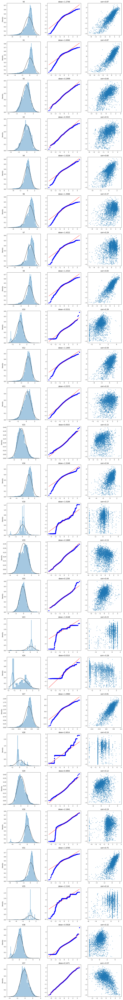

In [7]:
feature_cols = 3
columns = list(train_data.columns)
columns.remove('target')
feature_rows = len(columns)
plt.figure(figsize = (5*feature_cols, 5*feature_rows))
count = 0

for c in columns:
    feature = train_data[[c, 'target']].dropna()

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    sns.distplot(feature[c], fit=stats.norm)
    plt.title(c)
    plt.xlabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    s = stats.probplot(feature[c], plot=plt)
    plt.title('skew=' + '{:.4f}'.format(stats.skew(feature[c])))
    plt.xlabel('')
    plt.ylabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    plt.plot(feature[c], feature['target'], '.',alpha=0.5)
    plt.title('corr=' + '{:.2f}'.format(np.corrcoef(feature[c], feature['target'])[0][1]))

### Box-Cox transformation of features can significantly improve the normality, symmetry and equality of variance of data

### Next, we perform Box-Cox transformation on all features. The first three figures in a column represent the original distribution of the feature before transformation, and the last three columns show the distribution after data transformation.

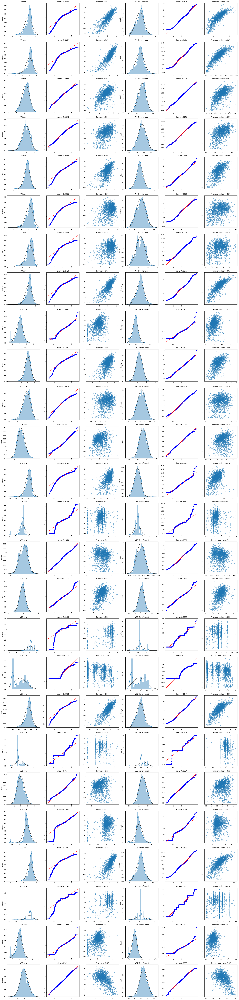

In [8]:
feature_cols = 6
columns = list(train_data.columns)
columns.remove('target')
feature_rows = len(columns)
plt.figure(figsize = (5*feature_cols, 5*feature_rows))
count = 0

scaler = preprocessing.MinMaxScaler()


for c in columns:
    feature = train_data[[c, 'target']].dropna()

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    sns.distplot(feature[c], fit=stats.norm)
    plt.title(c + ' raw')
    plt.xlabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    s1 = stats.probplot(feature[c], plot=plt)
    plt.title('skew=' + '{:.4f}'.format(stats.skew(feature[c])))
    plt.xlabel('')
    plt.ylabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    plt.plot(feature[c], feature['target'], '.',alpha=0.5)
    plt.title('Raw corr=' + '{:.2f}'.format(np.corrcoef(feature[c], feature['target'])[0][1]))

    # Box-Cox transformation
    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    scaled_feature = scaler.fit_transform(feature[[c]]) + 1
    trans_feature, lambda_feature = stats.boxcox(scaled_feature.flatten())
    sns.distplot(trans_feature, fit=stats.norm)
    plt.title(c + ' Transformed')
    plt.xlabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    s2 = stats.probplot(trans_feature, plot=plt)
    plt.title('skew=' + '{:.4f}'.format(stats.skew(trans_feature)))
    plt.xlabel('')
    plt.ylabel('')

    count += 1
    plt.subplot(feature_rows, feature_cols, count)
    plt.plot(trans_feature, feature['target'], '.', alpha=0.5)
    plt.title('Transformed corr=' + '{:.2f}'.format(np.corrcoef(feature[c], feature['target'])[0][1]))


### Now we can see that the normality of the data has improved significantly

### Next, we perform Box-Cox transformation on the original data and save it in place

In [9]:
all_data.head()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V27,V28,V29,V30,V31,V35,V36,V37,target,label
0,0.566,0.016,-0.143,0.407,0.452,-1.812,-2.360,-0.436,-0.940,-0.073,...,0.168,-0.450,0.136,0.109,-0.615,-5.101,-2.608,-3.508,0.175,train
1,0.968,0.437,0.066,0.566,0.194,-1.566,-2.360,0.332,0.188,-0.134,...,0.338,0.671,-0.128,0.124,0.032,0.364,-0.335,-0.730,0.676,train
2,1.013,0.568,0.235,0.370,0.112,-1.367,-2.360,0.396,0.874,-0.072,...,0.326,1.287,-0.009,0.361,0.277,0.364,0.765,-0.589,0.633,train
3,0.733,0.368,0.283,0.165,0.599,-1.200,-2.086,0.403,0.011,-0.014,...,0.277,1.298,0.015,0.417,0.279,0.364,0.333,-0.112,0.206,train
4,0.684,0.638,0.260,0.209,0.337,-1.073,-2.086,0.314,-0.251,0.199,...,0.332,1.289,0.183,1.078,0.328,0.364,-0.280,-0.028,0.384,train


In [10]:
columns = list(all_data.columns)
columns.remove('label')
columns.remove('target')
scaler = preprocessing.MinMaxScaler()


for col in columns: 
    all_data.loc[:, col] = scaler.fit_transform(all_data[[col]])
    all_data.loc[:, col], _ = stats.boxcox(all_data.loc[:,col]+1)

all_data.head()

,V0,V1,V2,V3,V4,V6,V7,V8,V10,V12,...,V27,V28,V29,V30,V31,V35,V36,V37,target,label
0,4.147084,5.841183,0.918479,0.921088,1.205738,1.864357,1.568184,3.799373,0.262782,1.495579,...,8923.044714,0.238101,0.300080,1.788352,15.555190,0.519843,0.000000,0.018284,0.175,train
1,4.988271,7.279840,0.984897,0.964538,1.110508,2.148236,1.568184,5.377114,0.493786,1.463960,...,11039.688969,0.344949,0.280397,1.800049,21.939735,9.178637,0.369734,0.407834,0.676,train
2,5.090224,7.783637,1.040170,0.911078,1.081218,2.401542,1.568184,5.529583,0.655989,1.496101,...,10875.915492,0.397477,0.289379,1.992162,24.904403,9.178637,0.611879,0.426451,0.633,train
3,4.481728,7.025645,1.056127,0.856314,1.262126,2.631664,1.888754,5.546472,0.454651,1.526600,...,10230.735113,0.398380,0.291168,2.039607,24.929995,9.178637,0.511483,0.488736,0.206,train
4,4.381416,8.064593,1.048466,0.867969,1.162709,2.818014,1.888754,5.334857,0.398723,1.642253,...,10957.512634,0.397641,0.303493,2.663214,25.564336,9.178637,0.380802,0.499597,0.384,train


## 5. Define methods for getting data

### Next we will use many models and verify their effectiveness. We need some functions to quickly obtain training and test data.

In [11]:
from sklearn.model_selection import train_test_split
def get_train_data():
    train_data = all_data[all_data['label'] == 'train']
    y = train_data.target
    X = train_data.drop(['label','target'], axis=1)
    return X,y

def split_train_data():
    train_data = all_data[all_data['label'] == 'train']
    y = train_data.target
    X = train_data.drop(['label','target'], axis=1)
    X_train, X_valid, y_train, y_valid = train_test_split(X,y, test_size=0.2)
    return X_train, X_valid, y_train, y_valid

def get_test_data():
    test_data = all_data[all_data['label'] == 'test'].reset_index(drop=True)
    return test_data.drop(['label', 'target'], axis=1)

## 6. Outlier Filtering

### Next, we define a function to find outliers. The default outlier range is beyond $3 \sigma$. Of course, you can also manually adjust it in the parameters.

In [12]:
from sklearn.metrics import mean_squared_error

def find_outliers(model, X, y, sigma=3):
    model.fit(X,y)  # Fit the training data
    y_pred = pd.Series(model.predict(X), index=y.index)

    # Calculate the difference between the predicted value and the true value
    resid = y - y_pred
    mean_resid = resid.mean()
    std_resid = resid.std()

    # Find outliers based on sigma
    z = (resid - mean_resid)/std_resid   # Z-score normalization
    outliers = z[abs(z) > sigma].index 

    # Print model evaluation
    print('R2=', model.score(X,y))
    print('MSE=', mean_squared_error(y,y_pred))
    print('---------------------------------------')

    print('mean of residuals: ', mean_resid)
    print('standard deviation of residuals: ', std_resid)
    print('---------------------------------------')

    print(len(outliers), 'outliers:')
    print(outliers.tolist())

    # Data visualization
    # Scatter plot of true value and predicted value
    plt.figure(figsize=(15,5))
    ax_131 = plt.subplot(1,3,1)
    plt.plot(y, y_pred, '.')
    plt.plot(y.loc[outliers], y_pred.loc[outliers], 'ro')
    plt.legend(['Accepted', 'Outliers'])
    plt.xlabel('y')
    plt.ylabel('y_pred')

    # Scatter plot of true values and residuals
    ax_132 = plt.subplot(1,3,2)
    plt.plot(y,y_pred, '.')
    plt.plot(y.loc[outliers], y.loc[outliers] - y_pred.loc[outliers], 'ro')
    plt.legend(['Accepted', 'Outliers'])
    plt.xlabel('y')
    plt.ylabel('y - y_pred')

    # Histogram
    ax_133 = plt.subplot(1,3,3)
    z.plot.hist(bins=50, ax=ax_133)
    z.loc[outliers].plot.hist(color='r', bins=50, ax=ax_133)
    plt.legend(['Accepted', 'Outliers'])
    plt.xlabel('z')


    return outliers

## 6.1 Detecting outliers using ridge regression

R2= 0.8689910085069088
MSE= 0.12679747771753333
---------------------------------------
mean of residuals:  5.720262675353992e-16
standard deviation of residuals:  0.3561479999510738
---------------------------------------
30 outliers:
[348, 884, 1046, 1069, 1145, 1164, 1310, 1458, 1493, 1523, 1530, 1704, 1874, 2002, 2159, 2160, 2279, 2528, 2620, 2645, 2647, 2667, 2668, 2669, 2696, 2697, 2769, 2807, 2842, 2863]


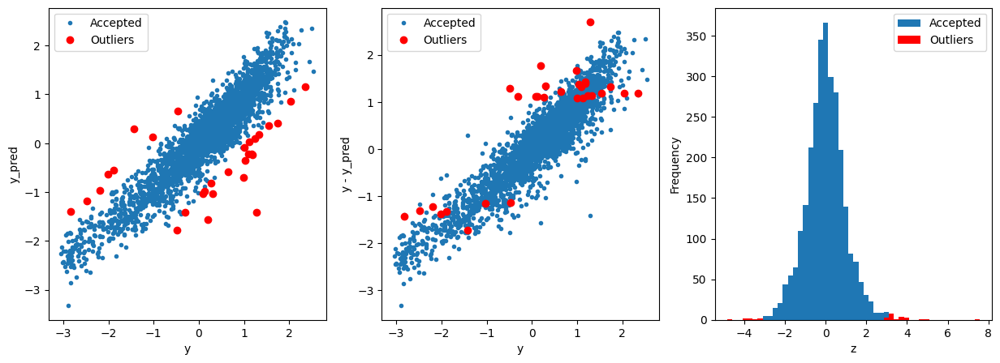

In [13]:
from sklearn.linear_model import Ridge
X_train, y_train = get_train_data()

outliers1 = find_outliers(Ridge(), X_train, y_train)

## 6.2 Detecting outliers using the lasso regression

R2= 0.6220218852407662
MSE= 0.36582734541870476
---------------------------------------
mean of residuals:  0.0
standard deviation of residuals:  0.6049413697324092
---------------------------------------
31 outliers:
[332, 343, 376, 430, 884, 1064, 1065, 1126, 1311, 1365, 1442, 1477, 1828, 1874, 1932, 2030, 2253, 2254, 2255, 2256, 2257, 2279, 2281, 2579, 2580, 2581, 2636, 2663, 2667, 2790, 2807]


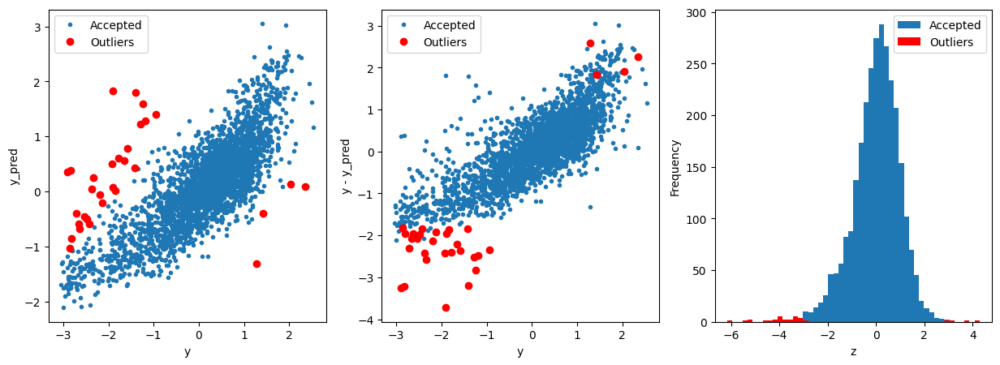

In [14]:
from sklearn.linear_model import Lasso
X_train, y_train = get_train_data()

outliers2 = find_outliers(Lasso(), X_train, y_train)

## 6.3 Detecting outliers using support vector machine (SVR) regression

R2= 0.6631743598173332
MSE= 0.3259977893044682
---------------------------------------
mean of residuals:  -0.04437450742295164
standard deviation of residuals:  0.5693337593709102
---------------------------------------
39 outliers:
[332, 343, 376, 884, 1064, 1065, 1126, 1138, 1311, 1365, 1442, 1477, 1828, 1874, 1932, 2030, 2161, 2253, 2254, 2255, 2256, 2257, 2264, 2279, 2281, 2334, 2339, 2579, 2580, 2581, 2620, 2635, 2636, 2637, 2645, 2663, 2667, 2790, 2807]


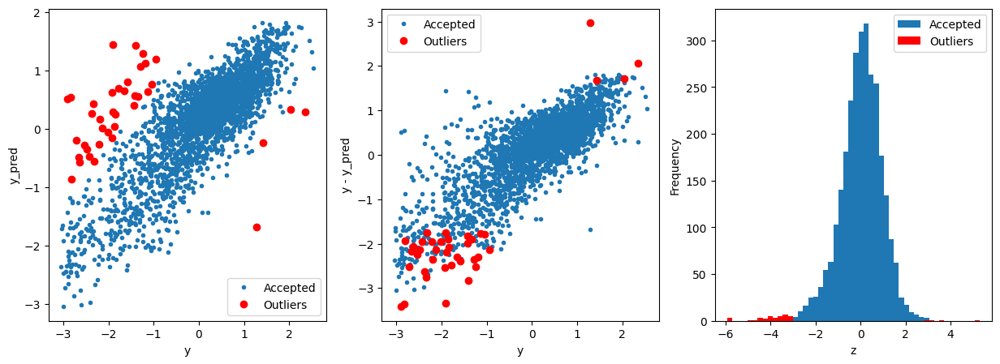

In [15]:
from sklearn.svm import SVR
X_train, y_train = get_train_data()

outliers3 = find_outliers(SVR(), X_train, y_train)

## 6.4 Detecting outliers using the Xgboost algorithm

R2= 0.9982587657711353
MSE= 0.0016852592010612448
---------------------------------------
mean of residuals:  3.6208939876916126e-05
standard deviation of residuals:  0.04105900181629557
---------------------------------------
38 outliers:
[172, 178, 179, 283, 565, 609, 722, 725, 846, 1100, 1145, 1187, 1359, 1433, 1470, 1472, 1492, 1530, 1592, 1600, 1648, 1837, 1884, 1954, 1959, 1972, 2098, 2182, 2211, 2274, 2308, 2392, 2450, 2556, 2683, 2687, 2696, 2864]


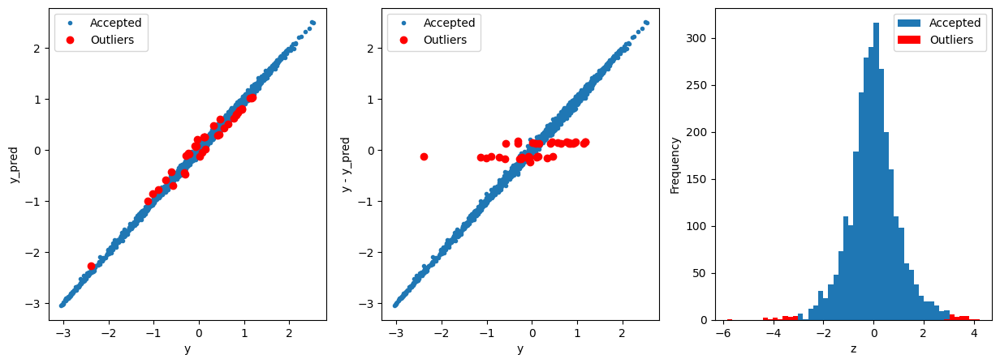

In [16]:
from xgboost import XGBRegressor
X_train, y_train = get_train_data()

outliers4 = find_outliers(XGBRegressor(), X_train, y_train)

## 6.5 Filter Outliers

In [17]:
outliers12 = np.union1d(outliers1,outliers2)
outliers34 = np.union1d(outliers3,outliers4)
outliers = np.union1d(outliers12,outliers34)
display(outliers)

all_data = all_data.drop(labels=outliers)
all_data.to_csv('./processed_zhengqi_data2.csv',index=False)
all_data.shape

array([ 172,  178,  179,  283,  332,  343,  348,  376,  430,  565,  609,
        722,  725,  846,  884, 1046, 1064, 1065, 1069, 1100, 1126, 1138,
       1145, 1164, 1187, 1310, 1311, 1359, 1365, 1433, 1442, 1458, 1470,
       1472, 1477, 1492, 1493, 1523, 1530, 1592, 1600, 1648, 1704, 1828,
       1837, 1874, 1884, 1932, 1954, 1959, 1972, 2002, 2030, 2098, 2159,
       2160, 2161, 2182, 2211, 2253, 2254, 2255, 2256, 2257, 2264, 2274,
       2279, 2281, 2308, 2334, 2339, 2392, 2450, 2528, 2556, 2579, 2580,
       2581, 2620, 2635, 2636, 2637, 2645, 2647, 2663, 2667, 2668, 2669,
       2683, 2687, 2696, 2697, 2769, 2790, 2807, 2842, 2863, 2864],
      dtype=int64)

(4715, 28)

## 7. Multicollinearity

### 7.1 The concept of multicollinearity

#### Multicollinearity refers to the existence of a linear correlation between features, that is, one feature can be a linear combination of one or more other features. 
#### If multicollinearity exists, the matrix used to calculate the loss function is a singular matrix, resulting in a deviation between the calculated result and the actual result.

#### In order to solve multicollinearity, we need to reduce the dimension of linearly related features.

### 7.2 The impact of multicollinearity on the model

#### <ul>
####        <li>Lead to large standard errors for the regression coefficients</li>
####        <li>it becomes difficult to interpret the individual impact of each predictor on the dependent variable</li>
####        <li>High multicollinearity increases the variance of coefficient estimates</li>
####        <li>Make it challenging to identify the most significant predictors</li>
#### </ul>

### 7.3 How to test for multicollinearity

#### Generally, we use the variance inflation factor (VIF) to test for multicollinearity.
#### <ui>
####     <li>VIF < 10: Weak or No multicollinearity</li>
####     <li>10 <= VIF < 100: Strong multicollinearity </li>
####     <li>VIF >= 100 : Severe multicollinearity</li>
#### </ui>

In [18]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

### 7.4 Check VIF

In [19]:
X_train, y_train = get_train_data()
X_train = np.matrix(X_train)
VIF_list = [round(variance_inflation_factor(X_train,i),2) for i in range(X_train.shape[1])]
print(len(VIF_list) , 'dimensions:')
display(VIF_list)

26 dimensions:


[111.62,
 105.57,
 83.38,
 18.95,
 154.29,
 131.84,
 69.82,
 158.67,
 59.84,
 113.37,
 15.32,
 189.18,
 84.85,
 13.58,
 13.01,
 42.82,
 36.63,
 4.98,
 121.92,
 14.91,
 236.15,
 12.57,
 76.19,
 39.26,
 53.52,
 39.4]

### 7.5 Perform PCA dimensionality reduction on the data

In [20]:
from sklearn.decomposition import PCA
pca = PCA(n_components=20, whiten=True)
X_train, y_train = get_train_data()
X_train_pca = np.matrix(pca.fit_transform(X_train))
VIF_list = [round(variance_inflation_factor(X_train_pca,i),2) for i in range(X_train_pca.shape[1])]
print(len(VIF_list) , 'dimensions:')
display(VIF_list)
# save data
np.savez('./train_data_pca',X_train = X_train_pca,y_train = y_train)

20 dimensions:


[1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

#### Now that we have eliminated multicollinearity

####  The same process is performed on the test data.

In [21]:
X_test = get_test_data()
X_test_pca = pca.transform(X_test)
X_test_pca
# save data
np.savez('./test_data_pca',X_test = X_test_pca)

## 8. Model Initial Verification

### 8.1 Import package

In [22]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
import lightgbm as lgb
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

### 8.2 Data Splitting

In [23]:
train_data = np.load('./train_data_pca.npz')['X_train']
target_data = np.load('./train_data_pca.npz')['y_train']
# Split data: training data 80% validation data 20%
X_train,X_valid,y_train,y_valid=train_test_split(train_data,target_data, test_size=0.2)

### 8.3 Multiple Linear Regression Model

In [24]:
clf = LinearRegression()
clf.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf.predict(X_valid))
print("LinearRegression:   ", score)

LinearRegression:    0.12072938161340437


### 8.4 Data validation visualization

In [25]:
def plot_learning_curve(model, X_train, X_valid, y_train, y_valid):
    # X_train, y_train: training set features and target variables
    # X_valid, y_valid: validation set features and target variables

    # Initialize the error list
    train_score = []
    test_score = []

    # We will add 10 samples each time during training
    # Check how the model performs with more samples.
    for i in range(10, len(X_train)+1, 10):
        model.fit(X_train[:i], y_train[:i])
        y_train_predict = model.predict(X_train[:i])
        train_score.append(mean_squared_error(y_train[:i], y_train_predict))

        # Use the model to make predictions on the entire validation set
        y_valid_predict = model.predict(X_valid)
        test_score.append(mean_squared_error(y_valid, y_valid_predict))
    
    # Plotting the learning curve
    plt.plot([i for i in range(1, len(train_score)+1)],
            train_score, label="train")
    plt.plot([i for i in range(1, len(test_score)+1)],
            test_score, label="test")
    plt.legend()

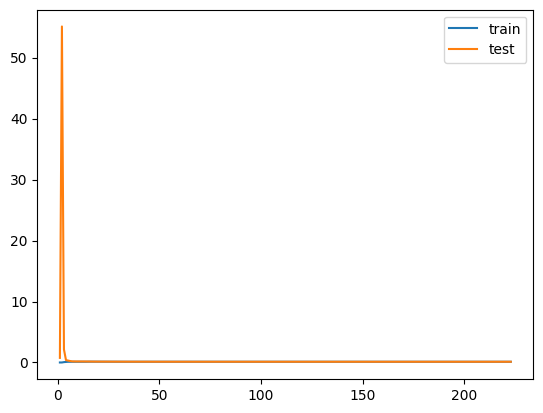

In [26]:
plot_learning_curve(LinearRegression(), X_train, X_valid, y_train, y_valid)

### 8.5 K-nearest neighbor algorithm

In [27]:
for i in range(3,20):
    clf = KNeighborsRegressor(n_neighbors=i)
    clf.fit(X_train, y_train)
    score = mean_squared_error(y_valid, clf.predict(X_valid))
    print( i, "th KNeighborsRegressor: " , score)

3 th KNeighborsRegressor:  0.2643171083233771
4 th KNeighborsRegressor:  0.2757358048835125
5 th KNeighborsRegressor:  0.2793039377060932
6 th KNeighborsRegressor:  0.2817449240342493
7 th KNeighborsRegressor:  0.2861892727671714
8 th KNeighborsRegressor:  0.2800757818100358
9 th KNeighborsRegressor:  0.2874086325722377
10 th KNeighborsRegressor:  0.2942008624551971
11 th KNeighborsRegressor:  0.2951185105897687
12 th KNeighborsRegressor:  0.29676598214107924
13 th KNeighborsRegressor:  0.3001781927424657
14 th KNeighborsRegressor:  0.3074294124241094
15 th KNeighborsRegressor:  0.3084794757945042
16 th KNeighborsRegressor:  0.30662846146953404
17 th KNeighborsRegressor:  0.31036390632635086
18 th KNeighborsRegressor:  0.31458120480994733
19 th KNeighborsRegressor:  0.31276623110336677


### 8.6 Decision Tree Regression algorithm

In [28]:
clf = RandomForestRegressor(n_estimators=200,
                           max_depth=10,
                           max_features='sqrt',
                           min_samples_leaf=10,
                           min_samples_split=40,
                           criterion='squared_error')

clf.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf.predict(X_valid))
print("Random Forest Regressor Prediction: ", score)

Random Forest Regressor Prediction:  0.24274021524693185


### 8.7 Support Vector Machine (SVR) algorithm

In [29]:
'''
C:
The larger the penalty coefficient C of the error term, the greater the penalty for misclassified samples, 
so the higher the accuracy in the training samples,but the generalization ability is reduced; 
on the contrary, if C is reduced, some misclassified samples in the training samples are allowed, and the generalization ability is strong.
For the case where the training samples are noisy, the latter is generally used, 
and the samples that are misclassified in the training sample set are regarded as noise.

gamma:
The coefficient of the kernel function of ‘rbf’, ‘poly’ and ‘sigmoid’
epsilon:
1. Used to define the tolerance of the model for misclassification, that is, misclassification without penalty
2. The larger the value of epsilon, the higher the tolerance of the model for misclassification, and vice versa, the smaller the tolerance
3. The number of support vectors is sensitive to the size of epsilon, that is, the larger the value of epsilon, the fewer the number of support vectors
4. It can also be understood that the smaller the value of epsilon, the more overfitting the model

'''
clf1 = SVR(kernel='rbf',C = 1,gamma=0.01,tol = 0.0001,epsilon=0.3)
clf1.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf1.predict(X_valid))
print("SVM Gaussian Kernel Function:   ", score)

clf2 = SVR(kernel='poly')
clf2.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf2.predict(X_valid))
print("SVM polynomial kernel function:   ", score)


SVM Gaussian Kernel Function:    0.11281814208452232
SVM polynomial kernel function:    0.4173307540146969


### 8.8  lightGBM algorithm

In [30]:
'''
min_child_samples
The minimum amount of data on a leaf. The default setting is 20.
Determined by the amount of data. When the amount of data is large,
Should be increased to make the data distribution of leaf nodes relatively stable and improve the generalization ability of the model.

max_depth:
The maximum depth of the tree model. The most important parameter to prevent overfitting, generally limited to 3~5.
It is a core parameter that needs to be adjusted and plays a decisive role in model performance and generalization ability.

num_leaves:
The number of leaf nodes on a tree. The default setting is 31, 
and it is used with max_depth to shape the null value tree. 
It is usually set to a value of (0, 2^max_depth - 1].
It is a parameter that needs to be adjusted and has a great impact on model performance.

reg_alpha:
L1 regularization parameter, alias: lambda_l1. The default setting is 0. 
Generally, this parameter will not have a particularly large difference after feature selection.
If it is found that the value of this parameter is large, it means that there are some features that do not have much effect in the model.
It needs to be adjusted to control overfitting.

reg_lambda:
L2 regularization parameter, alias: lambda_l2. The default setting is 0.
A larger value will make the influence of each feature on the model tend to be uniform,
no single feature will dominate the performance of the entire model. 
It needs to be adjusted to control overfitting
'''

clf = lgb.LGBMRegressor(learning_rate=0.05,    # Learning Rate
                        n_estimators=300,      # Number of ensemble trees
                        min_child_samples=5,   # Minimum number of samples required for a leaf node
                        max_depth=6,           # Decision Tree Depth
                        num_leaves = 31,
                        colsample_bytree =0.8, # Feature selection ratio when building a tree
                        subsample=0.8, 
                        reg_alpha = 0.1,
                        reg_lambda = 0.01 )


clf.fit(X_train, y_train)
score = mean_squared_error(y_valid, clf.predict(X_valid))
print("LGB model mean square error:   ", score)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5100
[LightGBM] [Info] Number of data points in the train set: 2232, number of used features: 20
[LightGBM] [Info] Start training from score 0.135753
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, 

### 8.9 Conclusion

### <ui>
###    <li> K-nearest neighbor algorithm, decision tree regression performs poorly </li>
###    <li> Multiple linear regression needs further verification (because of overfitting) </li>
### </ui>